# 查看根目录下需要运行的文件夹

In [6]:
from pathlib import Path

version = "v1"
run_type = "pose_and_det"  # "pose_and_det" or "cls"

path = Path("/workspace/models/SAHI/run_v7")
chosen_dirs = [d / "raw_data" for d in path.iterdir() if d.is_dir()]
print("子文件夹路径列表：", chosen_dirs)

子文件夹路径列表： [PosixPath('/workspace/models/SAHI/run_v7/ms1_0726-0809_11/raw_data'), PosixPath('/workspace/models/SAHI/run_v7/air1_0729-0813_5/raw_data'), PosixPath('/workspace/models/SAHI/run_v7/air1_0826-0909_21_no/raw_data'), PosixPath('/workspace/models/SAHI/run_v7/air2_0729-0813_04/raw_data'), PosixPath('/workspace/models/SAHI/run_v7/air2_0826-0909_25_no/raw_data'), PosixPath('/workspace/models/SAHI/run_v7/jeff_0613-0624_04_ok/raw_data'), PosixPath('/workspace/models/SAHI/run_v7/jeff_0624-0702_01_ok/raw_data'), PosixPath('/workspace/models/SAHI/run_v7/jeff_0730-0813_01/raw_data'), PosixPath('/workspace/models/SAHI/run_v7/lloyd_0603-0618_31/raw_data'), PosixPath('/workspace/models/SAHI/run_v7/lloyd_0715-0729_04/raw_data'), PosixPath('/workspace/models/SAHI/run_v7/lloyd_0826-0909_04/raw_data'), PosixPath('/workspace/models/SAHI/run_v7/ms1_0605-0621_40/raw_data'), PosixPath('/workspace/models/SAHI/run_v7/ms1_0621-0710_04/raw_data'), PosixPath('/workspace/models/SAHI/run_v7/ms1_0710-0726_

# 绘图
### 输入输出
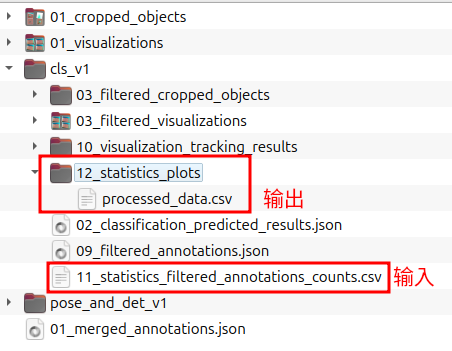

### 效果
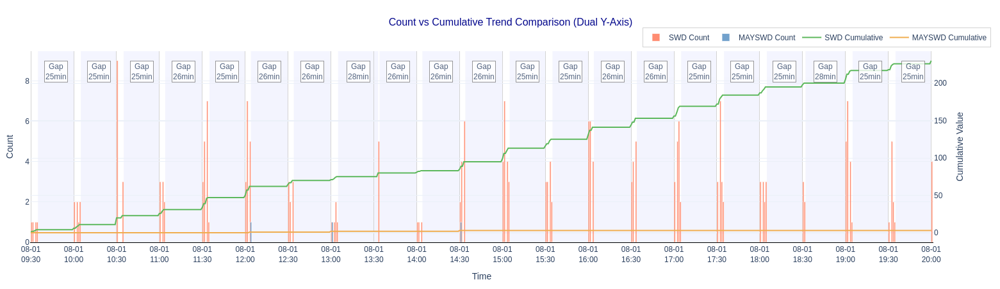

In [10]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np
from datetime import datetime, timedelta

def create_time_series_plots(
    data_path,
    output_dir=None,

    # 时间相关参数
    year_prefix=2024,
    time_format='%Y-%m-%d %H:%M',
    missing_threshold_minutes=30,
    interpolation_freq='1min',

    # 图表尺寸参数
    fig_width=None, # None=自动适应
    fig_height=None,
    dual_yaxis_fig_height=None,  # 双Y轴图的高度
    
    # 轴标签间隔参数
    xaxis_tick_interval_minutes=60,  # X轴标签间隔（分钟）
    xaxis_tick_format='%H:%M',       # X轴时间格式
    yaxis_tick_interval=None,        # Y轴标签间隔（自动计算）
    
    # 颜色参数
    color_swd_count='red',
    color_mayswd_count='blue',
    color_swd_cumu='orange',
    color_mayswd_cumu='green',
    color_missing_bg='lightgray',
    
    # 数据系列参数
    show_swd=True,
    show_mayswd=True,
    opacity=0.7,
    line_width=2,

    # 绘制开关
    show_count_chart=True,
    show_cumulative_chart=True,
    show_dual_axis_chart=True,
    show_timeline_chart=True,
    
    # 图表标题参数
    chart_titles=None  # 自定义标题字典
):
    """
    创建时间序列分析图表（支持缺失数据检测和可视化）
    
    Parameters:
    -----------
    data_path : str
        数据文件路径
    output_dir : str, optional
        输出目录，如果提供则保存图表和数据
    year_prefix : int
        年份前缀（用于时间解析）
    time_format : str
        时间格式
    missing_threshold_minutes : int
        缺失数据阈值（分钟）
    interpolation_freq : str
        插值频率
        
    # 新增参数
    fig_width : int
        图表宽度（像素）
    fig_height : int
        普通图表高度（像素）
    dual_yaxis_fig_height : int
        双Y轴图表高度（像素）
    xaxis_tick_interval_minutes : int
        X轴标签显示间隔（分钟）
    xaxis_tick_format : str
        X轴时间显示格式
    yaxis_tick_interval : int or None
        Y轴标签间隔（None为自动计算）
    
    # 原有参数...
    """
    
    # 设置默认标题
    if chart_titles is None:
        chart_titles = {
            'count_chart': "Event Count Chart (Original Data)",
            'cumulative_chart': "Cumulative Trend Chart (Continuous)",
            'dual_axis_chart': "Count vs Cumulative Trend Comparison (Dual Y-Axis)",
            'timeline_chart': "Data Availability Timeline"
        }
    
    # 读取数据
    df = pd.read_csv(data_path)
    
    # 转换时间列
    df['time'] = pd.to_datetime(f'{year_prefix}-' + df['time'], format=time_format)
    df.set_index('time', inplace=True)
    
    # 创建完整的时间序列
    start_time = df.index.min()
    end_time = df.index.max()
    full_time_index = pd.date_range(start=start_time, end=end_time, freq=interpolation_freq)
    df_full = df.reindex(full_time_index)
    
    # 插值处理
    
    df_full['swd_cumu'] = df_full['swd_cumu'].ffill().fillna(0)
    df_full['swd_count'] = df_full['swd_count'].fillna(0)

    if show_mayswd:
        df_full['mayswd_cumu'] = df_full['mayswd_cumu'].ffill().fillna(0)
        df_full['mayswd_count'] = df_full['mayswd_count'].fillna(0)

    # 检测缺失时间段
    def find_missing_periods(time_index, threshold_minutes, protect_minutes=1):
        if len(time_index) == 0:
            return []

        # 保证是普通 list
        times = list(sorted(time_index.to_pydatetime() if hasattr(time_index, "to_pydatetime") else time_index))

        missing_periods = []
        prot = timedelta(minutes=protect_minutes)

        for i in range(1, len(times)):
            gap = times[i] - times[i-1]
            gap_min = gap.total_seconds() / 60.0

            if gap_min > threshold_minutes:
                start = times[i-1] + prot
                end   = times[i]
                if end >= start:
                    missing_periods.append({
                        'start': start,
                        'end': end,
                        'duration_minutes': (end - start).total_seconds() / 60.0,
                        'raw_gap_minutes': gap_min
                    })

        return missing_periods

    
    missing_periods = find_missing_periods(df.index, missing_threshold_minutes)
    
    # 添加缺失时间段背景的函数
    def add_missing_periods_shapes(fig, periods, row=None, col=None):
        for period in periods:
            fig.add_vrect(
                x0=period['start'], 
                x1=period['end'],
                fillcolor=color_missing_bg, 
                opacity=0.3,
                layer="below", 
                line_width=0,
                row=row, 
                col=col
            )
            
            mid_time = period['start'] + (period['end'] - period['start']) / 2
            fig.add_annotation(
                x=mid_time,
                y=0.95,
                yref="paper",
                text=f"Gap<br>{period['duration_minutes']:.0f}min",
                showarrow=False,
                bgcolor="white",
                bordercolor="gray",
                borderwidth=1,
                opacity=0.8,
                row=row,
                col=col
            )
    
    # 创建基础图表布局函数（新增轴标签间隔控制）
    def create_base_layout(fig, title, xaxis_title="Time", yaxis_title=None, 
                          show_legend=True, chart_height=None):
        
        if chart_height is None:
            chart_height = fig_height
            
        fig.update_layout(
            title=dict(
                text=title,
                x=0.5,
                xanchor='center',
                font=dict(size=16, color='darkblue')
            ),
            width=fig_width,
            height=chart_height,
            template="plotly_white",
            font=dict(family="Arial, sans-serif", size=12),
            margin=dict(l=50, r=50, t=80, b=50),
            plot_bgcolor='white',
            paper_bgcolor='white'
        )
        
        if show_legend:
            fig.update_layout(
                legend=dict(
                    orientation="h",
                    yanchor="bottom",
                    y=1.02,
                    xanchor="right",
                    x=1,
                    bgcolor='rgba(255,255,255,0.8)',
                    bordercolor='lightgray',
                    borderwidth=1
                )
            )
        
        # 更新X轴（新增标签间隔控制）
        fig.update_xaxes(
            title_text=xaxis_title,
            showgrid=True,
            gridwidth=1,
            gridcolor='lightgray',
            showline=True,
            linewidth=1,
            linecolor='black',
            # 控制X轴标签间隔
            dtick=xaxis_tick_interval_minutes * 60 * 1000,  # 转换为毫秒
            tickformat=xaxis_tick_format
        )
        
        # 更新Y轴（新增标签间隔控制）
        if yaxis_title:
            fig.update_yaxes(
                title_text=yaxis_title,
                showgrid=True,
                gridwidth=1,
                gridcolor='lightgray',
                showline=True,
                linewidth=1,
                linecolor='black',
                dtick=yaxis_tick_interval  # Y轴标签间隔
            )
        
        return fig
    
    # 图表1：计数图
    if show_count_chart:
        fig1 = go.Figure()
        add_missing_periods_shapes(fig1, missing_periods)
        
        if show_swd:
            fig1.add_trace(go.Bar(
                x=df.index, y=df['swd_count'], 
                name='SWD Count', 
                marker_color=color_swd_count, 
                opacity=opacity,
                width=60 * 1000,
                offset=0, # 修正偏移
                hovertemplate='Time: %{x}<br>SWD Count: %{y}<extra></extra>'
            ))
        
        if show_mayswd:
            fig1.add_trace(go.Bar(
                x=df.index, y=df['mayswd_count'], 
                name='MAYSWD Count', 
                marker_color=color_mayswd_count, 
                opacity=opacity,
                width=60 * 1000,
                offset=30 * 1000, # 半分钟偏移，避免重叠
                hovertemplate='Time: %{x}<br>MAYSWD Count: %{y}<extra></extra>'
            ))
        
        create_base_layout(fig1, chart_titles['count_chart'], "Time", "Count")
    
    # 图表2：累积图
    if show_cumulative_chart:
        fig2 = go.Figure()
        add_missing_periods_shapes(fig2, missing_periods)
        
        if show_swd:
            fig2.add_trace(go.Scatter(
                x=df_full.index, y=df_full['swd_cumu'], 
                mode='lines', 
                name='SWD Cumulative',
                line=dict(color=color_swd_cumu, width=line_width),
                hovertemplate='Time: %{x}<br>SWD Cumulative: %{y}<extra></extra>'
            ))
        
        if show_mayswd:
            fig2.add_trace(go.Scatter(
                x=df_full.index, y=df_full['mayswd_cumu'], 
                mode='lines', 
                name='MAYSWD Cumulative',
                line=dict(color=color_mayswd_cumu, width=line_width),
                hovertemplate='Time: %{x}<br>MAYSWD Cumulative: %{y}<extra></extra>'
            ))
        
        create_base_layout(fig2, chart_titles['cumulative_chart'], "Time", "Cumulative Value")
    
    # 图表3：双Y轴图
    if show_dual_axis_chart:
        fig3 = make_subplots(specs=[[{"secondary_y": True}]])
        add_missing_periods_shapes(fig3, missing_periods)
    
        # 主Y轴：计数数据
        if show_swd:
            fig3.add_trace(go.Bar(
                x=df.index, y=df['swd_count'], 
                name='SWD Count', 
                marker_color=color_swd_count, 
                opacity=opacity,
                width=60 * 1000,
                offset=0,
                hovertemplate='Time: %{x}<br>SWD Count: %{y}<extra></extra>'
            ), secondary_y=False)
        
        if show_mayswd:
            fig3.add_trace(go.Bar(
                x=df.index, y=df['mayswd_count'], 
                name='MAYSWD Count', 
                marker_color=color_mayswd_count, 
                opacity=opacity,
                width=60 * 1000,
                offset=30 * 1000,
                hovertemplate='Time: %{x}<br>MAYSWD Count: %{y}<extra></extra>'
            ), secondary_y=False)
        
        # 副Y轴：累积数据
        if show_swd:
            fig3.add_trace(go.Scatter(
                x=df_full.index, y=df_full['swd_cumu'], 
                mode='lines', 
                name='SWD Cumulative',
                line=dict(color=color_swd_cumu, width=line_width),
                hovertemplate='Time: %{x}<br>SWD Cumulative: %{y}<extra></extra>'
            ), secondary_y=True)
        
        if show_mayswd:
            fig3.add_trace(go.Scatter(
                x=df_full.index, y=df_full['mayswd_cumu'], 
                mode='lines', 
                name='MAYSWD Cumulative',
                line=dict(color=color_mayswd_cumu, width=line_width),
                hovertemplate='Time: %{x}<br>MAYSWD Cumulative: %{y}<extra></extra>'
            ), secondary_y=True)
        
        # 为双Y轴图设置特殊高度
        create_base_layout(fig3, chart_titles['dual_axis_chart'], "Time", chart_height=dual_yaxis_fig_height)
        fig3.update_yaxes(title_text="Count", secondary_y=False, dtick=yaxis_tick_interval)
        fig3.update_yaxes(title_text="Cumulative Value", secondary_y=True, dtick=yaxis_tick_interval)
    
    # 图表4：数据完整性时间线
    if show_timeline_chart:
        fig4 = go.Figure()
        
        completeness_data = []
        current_time = start_time
        for period in missing_periods:
            if current_time < period['start']:
                completeness_data.append({'start': current_time, 'end': period['start'], 'status': 'Available'})
            completeness_data.append({'start': period['start'], 'end': period['end'], 'status': 'Missing'})
            current_time = period['end']
        
        if current_time < end_time:
            completeness_data.append({'start': current_time, 'end': end_time, 'status': 'Available'})
        
        for segment in completeness_data:
            color = 'green' if segment['status'] == 'Available' else 'red'
            fig4.add_trace(go.Scatter(
                x=[segment['start'], segment['end']],
                y=[segment['status'], segment['status']],
                mode='lines',
                line=dict(color=color, width=15),
                name=segment['status'],
                showlegend=False,
                hovertemplate=f'Status: {segment["status"]}<br>Start: {segment["start"]}<br>End: {segment["end"]}<extra></extra>'
            ))
        
        create_base_layout(fig4, chart_titles['timeline_chart'], "Time", False)
        fig4.update_yaxes(
            tickvals=['Available', 'Missing'], 
            ticktext=['Data Available', 'Data Missing'],
            title_text="Data Status"
        )
        fig4.update_layout(height=300)  # 时间线图固定高度
    
    # 显示图表
    if show_count_chart:
        fig1.show()
    if show_cumulative_chart:
        fig2.show()
    if show_dual_axis_chart:
        fig3.show()
    if show_timeline_chart:
        fig4.show()

    # 输出统计信息
    total_duration = (end_time - start_time).total_seconds() / 60
    missing_duration = sum([p['duration_minutes'] for p in missing_periods])
    data_duration = total_duration - missing_duration
    
    print("=== Data Statistics ===")
    print(f"Time Range: {start_time} to {end_time}")
    print(f"Total Duration: {total_duration:.1f} minutes ({total_duration/60:.1f} hours)")
    print(f"Data Available: {data_duration:.1f} minutes ({data_duration/60:.1f} hours)")
    print(f"Data Missing: {missing_duration:.1f} minutes ({missing_duration/60:.1f} hours)")
    print(f"Data Completeness: {data_duration/total_duration*100:.2f}%")
    print(f"Number of Missing Periods: {len(missing_periods)}")
    print(f"SWD Total Events: {df['swd_count'].sum()}")
    if show_mayswd:
        print(f"MAYSWD Total Events: {df['mayswd_count'].sum()}")
    print(f"X-axis tick interval: {xaxis_tick_interval_minutes} minutes")
    print(f"Chart dimensions: {fig_width} x {fig_height} pixels")
    
    # 保存数据（可选）
    if output_dir:
        import os
        os.makedirs(output_dir, exist_ok=True)
        
        # 保存处理后的数据
        if show_mayswd:
            df_processed = pd.DataFrame({
                'time': df_full.index,
                'swd_count_original': df.reindex(full_time_index)['swd_count'].fillna(0),
                'mayswd_count_original': df.reindex(full_time_index)['mayswd_count'].fillna(0),
                'swd_cumu_continuous': df_full['swd_cumu'],
                'mayswd_cumu_continuous': df_full['mayswd_cumu']
            })
        else:
            df_processed = pd.DataFrame({
                'time': df_full.index,
                'swd_count_original': df.reindex(full_time_index)['swd_count'].fillna(0),
                'swd_cumu_continuous': df_full['swd_cumu'],
            })
        
        output_path = os.path.join(output_dir, 'processed_data.csv')
        df_processed.to_csv(output_path, index=False)
        print(f"Processed data saved to: {output_path}")
    
    # return {
    #     'figures': [fig1, fig2, fig3, fig4],
    #     'data_stats': {
    #         'total_duration': total_duration,
    #         'missing_duration': missing_duration,
    #         'data_completeness': data_duration/total_duration*100,
    #         'swd_total': df['swd_count'].sum(),
    #         'mayswd_total': df['mayswd_count'].sum()
    #     },
    #     'missing_periods': missing_periods
    # }



## cls模型图表

In [3]:
for chosen_dir in chosen_dirs:
    print(f"选择的目录: {chosen_dir}")

    chart_titles = {
        'count_chart': "Event Count Chart (Original Data)",
        'cumulative_chart': "Cumulative Trend Chart (Continuous)",
        'dual_axis_chart': "Count vs Cumulative Trend Comparison (Dual Y-Axis)",
        'timeline_chart': "Data Availability Timeline"
    }
    create_time_series_plots(
        data_path=chosen_dir.parent / "raw_data_sliced_merge" / f"cls_{version}" / "11_statistics_filtered_annotations_counts.csv",
        output_dir=chosen_dir.parent / "raw_data_sliced_merge" / f"cls_{version}" / "12_statistics_plots",
        # 时间相关参数
        year_prefix=2024,
        time_format='%Y-%m-%d %H:%M',
        missing_threshold_minutes=10,            # 设为x分钟以捕捉较短的缺失
        interpolation_freq='1min',
        
        # 图表尺寸参数
        fig_width=1600,                         # None=自动适应
        fig_height=None,                        # 普通图的高度
        dual_yaxis_fig_height=None,             # 双Y轴图的高度
        
        # 轴标签间隔参数
        xaxis_tick_interval_minutes=30,         # X轴标签间隔（分钟）
        xaxis_tick_format='%m-%d<br>%H:%M',     # X轴时间格式 （%H:%M, %m-%d<br>%H:%M）
        yaxis_tick_interval=None,               # Y轴标签间隔 None=自动计算
        
        # 颜色参数
        color_swd_count='#FF5733',
        color_mayswd_count='#337AB7',
        color_swd_cumu='#5CB85C',
        color_mayswd_cumu='#F0AD4E',
        color_missing_bg="#D9DCFA",            # 缺失时间段背景色
        
        # 数据系列参数
        show_swd=True,
        show_mayswd=True,
        opacity=0.7,
        line_width=2,

        # 绘制开关
        show_count_chart=False,
        show_cumulative_chart=False,
        show_dual_axis_chart=True,
        show_timeline_chart=False,
        
        # 图表标题参数
        chart_titles=chart_titles  # 自定义标题字典 None=使用默认标题
    )


选择的目录: /workspace/models/SAHI/run_v8/ms1_0726-0809_11/raw_data_sliced_merge


=== Data Statistics ===
Time Range: 2024-08-01 09:30:00 to 2024-08-01 20:00:00
Total Duration: 630.0 minutes (10.5 hours)
Data Available: 91.0 minutes (1.5 hours)
Data Missing: 539.0 minutes (9.0 hours)
Data Completeness: 14.44%
Number of Missing Periods: 21
SWD Total Events: 230
MAYSWD Total Events: 3
X-axis tick interval: 30 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v8/ms1_0726-0809_11/raw_data_sliced_merge/cls_v1/12_statistics_plots/processed_data.csv


## pose + det 模型图表

In [ ]:
for chosen_dir in chosen_dirs:
    print(f"选择的目录: {chosen_dir}")

    # 如果11_statistics_filtered_annotations_counts.csv只有一行数据，则跳过
    df_check = pd.read_csv(chosen_dir.parent / "raw_data_sliced_merge"
                            / f"pose_and_det_{version}" / "11_statistics_filtered_annotations_counts.csv")
    if df_check.shape[0] <= 1:
        print("数据行数<=1，跳过该目录")
        continue

    chart_titles = {
        'count_chart': "Event Count Chart (Original Data)",
        'cumulative_chart': "Cumulative Trend Chart (Continuous)",
        'dual_axis_chart': "Count vs Cumulative Trend Comparison (Dual Y-Axis)",
        'timeline_chart': "Data Availability Timeline"
    }
    create_time_series_plots(
        data_path=chosen_dir.parent / "raw_data_sliced_merge" / f"pose_and_det_{version}" / "11_statistics_filtered_annotations_counts.csv",
        output_dir=chosen_dir.parent / "raw_data_sliced_merge" / f"pose_and_det_{version}" / "12_statistics_plots",
        # 时间相关参数
        year_prefix=2024,
        time_format='%Y-%m-%d %H:%M',
        missing_threshold_minutes=10,            # 设为x分钟以捕捉较短的缺失
        interpolation_freq='1min',
        
        # 图表尺寸参数
        fig_width=1600,                         # None=自动适应
        fig_height=None,                        # 普通图的高度
        dual_yaxis_fig_height=None,             # 双Y轴图的高度
        
        # 轴标签间隔参数
        xaxis_tick_interval_minutes=0,          # X轴标签间隔（分钟） 0=表示自动
        xaxis_tick_format='%m-%d<br>%H:%M',     # X轴时间格式 （%H:%M, %m-%d<br>%H:%M）
        yaxis_tick_interval=None,               # Y轴标签间隔 None=自动计算
        
        # 颜色参数
        color_swd_count='#FF5733',
        color_mayswd_count='#337AB7',
        color_swd_cumu='#5CB85C',
        color_mayswd_cumu='#F0AD4E',
        color_missing_bg="#D9DCFA",            # 缺失时间段背景色
        
        # 数据系列参数
        show_swd=True,
        show_mayswd=False,
        opacity=0.7,
        line_width=2,

        # 绘制开关
        show_count_chart=False,
        show_cumulative_chart=False,
        show_dual_axis_chart=True,
        show_timeline_chart=False,
        
        # 图表标题参数
        chart_titles=chart_titles  # 自定义标题字典 None=使用默认标题
    )
    print("============================")

选择的目录: /workspace/models/SAHI/run_v7/ms1_0726-0809_11/raw_data


=== Data Statistics ===
Time Range: 2024-07-18 20:05:00 to 2024-08-03 19:43:00
Total Duration: 23018.0 minutes (383.6 hours)
Data Available: 595.0 minutes (9.9 hours)
Data Missing: 22423.0 minutes (373.7 hours)
Data Completeness: 2.58%
Number of Missing Periods: 197
SWD Total Events: 707
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/ms1_0726-0809_11/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/air1_0729-0813_5/raw_data
数据行数<=1，跳过该目录
选择的目录: /workspace/models/SAHI/run_v7/air1_0826-0909_21_no/raw_data


=== Data Statistics ===
Time Range: 2024-08-31 09:04:00 to 2024-09-07 09:24:00
Total Duration: 10100.0 minutes (168.3 hours)
Data Available: 6.0 minutes (0.1 hours)
Data Missing: 10094.0 minutes (168.2 hours)
Data Completeness: 0.06%
Number of Missing Periods: 6
SWD Total Events: 7
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/air1_0826-0909_21_no/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/air2_0729-0813_04/raw_data


=== Data Statistics ===
Time Range: 2024-07-29 19:06:00 to 2024-08-11 19:07:00
Total Duration: 18721.0 minutes (312.0 hours)
Data Available: 186.0 minutes (3.1 hours)
Data Missing: 18535.0 minutes (308.9 hours)
Data Completeness: 0.99%
Number of Missing Periods: 97
SWD Total Events: 170
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/air2_0729-0813_04/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/air2_0826-0909_25_no/raw_data


=== Data Statistics ===
Time Range: 2024-09-01 11:05:00 to 2024-09-04 12:38:00
Total Duration: 4413.0 minutes (73.5 hours)
Data Available: 11.0 minutes (0.2 hours)
Data Missing: 4402.0 minutes (73.4 hours)
Data Completeness: 0.25%
Number of Missing Periods: 4
SWD Total Events: 10
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/air2_0826-0909_25_no/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/jeff_0613-0624_04_ok/raw_data


=== Data Statistics ===
Time Range: 2024-06-14 06:02:00 to 2024-06-24 10:31:00
Total Duration: 14669.0 minutes (244.5 hours)
Data Available: 737.0 minutes (12.3 hours)
Data Missing: 13932.0 minutes (232.2 hours)
Data Completeness: 5.02%
Number of Missing Periods: 106
SWD Total Events: 257
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/jeff_0613-0624_04_ok/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/jeff_0624-0702_01_ok/raw_data


=== Data Statistics ===
Time Range: 2024-06-29 10:19:00 to 2024-07-01 06:41:00
Total Duration: 2662.0 minutes (44.4 hours)
Data Available: 2.0 minutes (0.0 hours)
Data Missing: 2660.0 minutes (44.3 hours)
Data Completeness: 0.08%
Number of Missing Periods: 2
SWD Total Events: 3
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/jeff_0624-0702_01_ok/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/jeff_0730-0813_01/raw_data
数据行数<=1，跳过该目录
选择的目录: /workspace/models/SAHI/run_v7/lloyd_0603-0618_31/raw_data


=== Data Statistics ===
Time Range: 2024-06-05 15:05:00 to 2024-06-18 11:08:00
Total Duration: 18483.0 minutes (308.1 hours)
Data Available: 21.0 minutes (0.3 hours)
Data Missing: 18462.0 minutes (307.7 hours)
Data Completeness: 0.11%
Number of Missing Periods: 21
SWD Total Events: 35
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/lloyd_0603-0618_31/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/lloyd_0715-0729_04/raw_data


=== Data Statistics ===
Time Range: 2024-07-16 06:29:00 to 2024-07-29 13:12:00
Total Duration: 19123.0 minutes (318.7 hours)
Data Available: 252.0 minutes (4.2 hours)
Data Missing: 18871.0 minutes (314.5 hours)
Data Completeness: 1.32%
Number of Missing Periods: 72
SWD Total Events: 144
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/lloyd_0715-0729_04/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/lloyd_0826-0909_04/raw_data
数据行数<=1，跳过该目录
选择的目录: /workspace/models/SAHI/run_v7/ms1_0605-0621_40/raw_data


=== Data Statistics ===
Time Range: 2024-06-06 06:03:00 to 2024-06-19 16:32:00
Total Duration: 19349.0 minutes (322.5 hours)
Data Available: 221.0 minutes (3.7 hours)
Data Missing: 19128.0 minutes (318.8 hours)
Data Completeness: 1.14%
Number of Missing Periods: 221
SWD Total Events: 864
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/ms1_0605-0621_40/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/ms1_0621-0710_04/raw_data


=== Data Statistics ===
Time Range: 2024-07-07 16:51:00 to 2024-07-09 19:53:00
Total Duration: 3062.0 minutes (51.0 hours)
Data Available: 45.0 minutes (0.8 hours)
Data Missing: 3017.0 minutes (50.3 hours)
Data Completeness: 1.47%
Number of Missing Periods: 33
SWD Total Events: 47
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/ms1_0621-0710_04/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/ms1_0710-0726_36/raw_data


=== Data Statistics ===
Time Range: 2024-07-10 08:48:00 to 2024-07-18 11:36:00
Total Duration: 11688.0 minutes (194.8 hours)
Data Available: 579.0 minutes (9.7 hours)
Data Missing: 11109.0 minutes (185.2 hours)
Data Completeness: 4.95%
Number of Missing Periods: 286
SWD Total Events: 1167
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/ms1_0710-0726_36/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/ms1_0809-0823_34/raw_data


=== Data Statistics ===
Time Range: 2024-08-04 08:13:00 to 2024-08-12 15:09:00
Total Duration: 11936.0 minutes (198.9 hours)
Data Available: 498.0 minutes (8.3 hours)
Data Missing: 11438.0 minutes (190.6 hours)
Data Completeness: 4.17%
Number of Missing Periods: 239
SWD Total Events: 577
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/ms1_0809-0823_34/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/ms1_0823-0906_25_no/raw_data


=== Data Statistics ===
Time Range: 2024-08-30 09:54:00 to 2024-09-06 06:53:00
Total Duration: 9899.0 minutes (165.0 hours)
Data Available: 39.0 minutes (0.7 hours)
Data Missing: 9860.0 minutes (164.3 hours)
Data Completeness: 0.39%
Number of Missing Periods: 13
SWD Total Events: 32
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/ms1_0823-0906_25_no/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/ms1_0906-0920_10_no/raw_data
数据行数<=1，跳过该目录
选择的目录: /workspace/models/SAHI/run_v7/ms2_0621-0710_01/raw_data


=== Data Statistics ===
Time Range: 2024-06-23 10:31:00 to 2024-07-11 06:37:00
Total Duration: 25686.0 minutes (428.1 hours)
Data Available: 44.0 minutes (0.7 hours)
Data Missing: 25642.0 minutes (427.4 hours)
Data Completeness: 0.17%
Number of Missing Periods: 24
SWD Total Events: 43
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/ms2_0621-0710_01/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/ms2_0726-0809_13/raw_data


=== Data Statistics ===
Time Range: 2024-07-27 06:07:00 to 2024-08-08 08:06:00
Total Duration: 17399.0 minutes (290.0 hours)
Data Available: 582.0 minutes (9.7 hours)
Data Missing: 16817.0 minutes (280.3 hours)
Data Completeness: 3.35%
Number of Missing Periods: 215
SWD Total Events: 750
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/ms2_0726-0809_13/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/ms2_0809-0823_10/raw_data


=== Data Statistics ===
Time Range: 2024-08-08 20:02:00 to 2024-08-22 07:06:00
Total Duration: 19384.0 minutes (323.1 hours)
Data Available: 462.0 minutes (7.7 hours)
Data Missing: 18922.0 minutes (315.4 hours)
Data Completeness: 2.38%
Number of Missing Periods: 153
SWD Total Events: 433
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/ms2_0809-0823_10/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/southfarm1_0701-0715_04/raw_data
数据行数<=1，跳过该目录
选择的目录: /workspace/models/SAHI/run_v7/southfarm1_0924-1007_01_no/raw_data


=== Data Statistics ===
Time Range: 2024-10-03 12:17:00 to 2024-10-05 12:13:00
Total Duration: 2876.0 minutes (47.9 hours)
Data Available: 2.0 minutes (0.0 hours)
Data Missing: 2874.0 minutes (47.9 hours)
Data Completeness: 0.07%
Number of Missing Periods: 2
SWD Total Events: 3
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/southfarm1_0924-1007_01_no/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/sw1_0605-0613_07_ok/raw_data


=== Data Statistics ===
Time Range: 2024-06-05 20:19:00 to 2024-06-06 18:17:00
Total Duration: 1318.0 minutes (22.0 hours)
Data Available: 2.0 minutes (0.0 hours)
Data Missing: 1316.0 minutes (21.9 hours)
Data Completeness: 0.15%
Number of Missing Periods: 2
SWD Total Events: 3
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/sw1_0605-0613_07_ok/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/sw1_0627-0711_02/raw_data


=== Data Statistics ===
Time Range: 2024-07-09 11:31:00 to 2024-07-10 08:54:00
Total Duration: 1283.0 minutes (21.4 hours)
Data Available: 4.0 minutes (0.1 hours)
Data Missing: 1279.0 minutes (21.3 hours)
Data Completeness: 0.31%
Number of Missing Periods: 3
SWD Total Events: 5
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/sw1_0627-0711_02/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/sw1_0711-0725_03/raw_data


=== Data Statistics ===
Time Range: 2024-07-13 07:32:00 to 2024-07-18 10:00:00
Total Duration: 7348.0 minutes (122.5 hours)
Data Available: 7.0 minutes (0.1 hours)
Data Missing: 7341.0 minutes (122.3 hours)
Data Completeness: 0.10%
Number of Missing Periods: 4
SWD Total Events: 7
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/sw1_0711-0725_03/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/sw1_0808-0823_01/raw_data


=== Data Statistics ===
Time Range: 2024-08-15 07:17:00 to 2024-08-21 23:04:00
Total Duration: 9587.0 minutes (159.8 hours)
Data Available: 8.0 minutes (0.1 hours)
Data Missing: 9579.0 minutes (159.7 hours)
Data Completeness: 0.08%
Number of Missing Periods: 8
SWD Total Events: 9
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/sw1_0808-0823_01/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/sw2_0725-0808_02/raw_data


=== Data Statistics ===
Time Range: 2024-07-25 07:20:00 to 2024-08-08 13:11:00
Total Duration: 20511.0 minutes (341.9 hours)
Data Available: 64.0 minutes (1.1 hours)
Data Missing: 20447.0 minutes (340.8 hours)
Data Completeness: 0.31%
Number of Missing Periods: 54
SWD Total Events: 62
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/sw2_0725-0808_02/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
选择的目录: /workspace/models/SAHI/run_v7/sw2_0808-0823_04/raw_data


=== Data Statistics ===
Time Range: 2024-08-09 09:39:00 to 2024-08-23 10:13:00
Total Duration: 20194.0 minutes (336.6 hours)
Data Available: 311.0 minutes (5.2 hours)
Data Missing: 19883.0 minutes (331.4 hours)
Data Completeness: 1.54%
Number of Missing Periods: 119
SWD Total Events: 284
X-axis tick interval: 0 minutes
Chart dimensions: 1600 x None pixels
Processed data saved to: /workspace/models/SAHI/run_v7/sw2_0808-0823_04/raw_data_sliced_merge/pose_and_det_v1/12_statistics_plots/processed_data.csv
